In [2]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf
import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model, Model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping
from keras.applications import VGG16
from keras.applications import InceptionV3


In [3]:
base_path = "../../data/Train_Test"
train_path = "../../data/Train_Test/Train/"
test_path = "../../data/Train_Test/Test/"

In [4]:
classes = ['Earth Quake', 'Floods', 'Landslide','Thunder Storms']

Class: Earth Quake


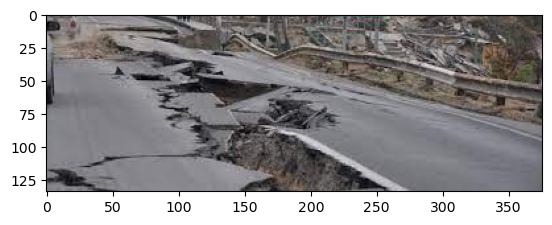



Class: Floods


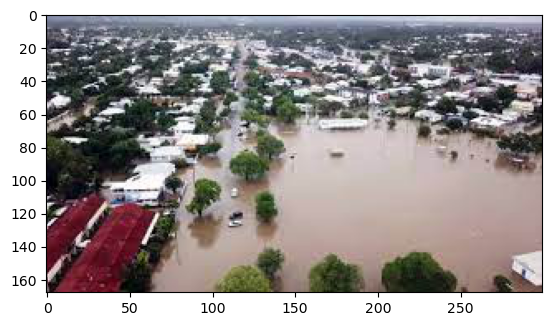



Class: Landslide


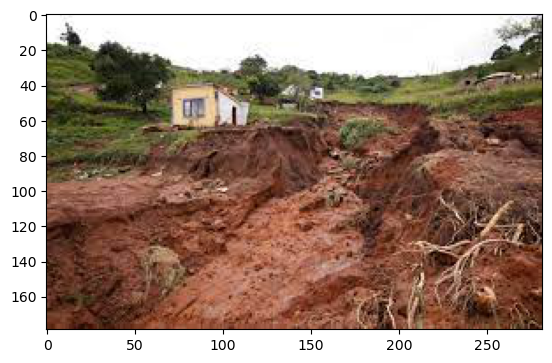



Class: Thunder Storms


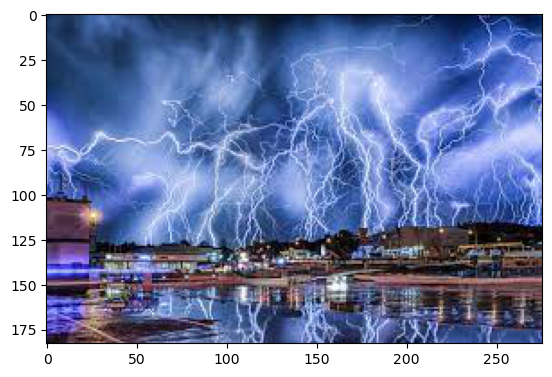

In [5]:
#plotting training image of each individual classs

for i in classes:
    print('Class:', i)
    path = os.path.join(train_path,i)
    
    for img in os.listdir(path):
        img_array = mpimg.imread(os.path.join(path, img))
        plt.imshow(img_array)
        plt.show()
        print('\n')
        break


AS we can see that images are of non-uniform dimensions. So we will set target size for all images

In [6]:
image_size = (300, 300)
batch_size = 4

In [7]:
image_size[0]

300

In [8]:
#create training data

train_datagen = ImageDataGenerator(rescale = 1.0/255,
                                     rotation_range=40,
                                     width_shift_range=0.2,
                                     height_shift_range=0.2,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(train_path,
                                                   target_size = image_size,
                                                   class_mode = 'categorical',
                                                    batch_size= batch_size)

Found 18 images belonging to 4 classes.


In [9]:
#create testing data
#for testing data we will provide directory as img_path instead os test_path because test_path has no subdirectories only list of images
#and classes = ['test'] so that it will generate from test folder only

test_datagen = ImageDataGenerator(rescale = 1.0/255)

test_generator = test_datagen.flow_from_directory(base_path,
                                                   target_size = image_size,
                                                   classes = ['Test'],
                                                   batch_size= batch_size)

Found 65 images belonging to 1 classes.


In [10]:
# Initialize the base model.
# Set the input shape and remove the dense layers.
inc = InceptionV3(input_shape = (image_size[0], image_size[1], 3), include_top = False, weights = 'imagenet' )

#we don't need to train weights again
for layer in inc.layers:
  layer.trainable = False

: 

: 

In [1]:
num=len(classes)
num

NameError: name 'classes' is not defined

In [ ]:
#build our customised model

x = layers.Flatten()(inc.output)
output = layers.Dense(units = num, activation = 'softmax')(x)

model = Model(inputs = inc.input, outputs = output)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 300, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_188 (Conv2D)            (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_188 (Batch  (None, 149, 149, 32  96         ['conv2d_188[0][0]']             
 Normalization)                 )                                                           

In [ ]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
#adding callback condition
cb = EarlyStopping(monitor = 'accuracy', patience = 3, min_delta = 0.01, verbose = 1)

In [ ]:
hist = model.fit(train_generator, epochs = 90, callbacks = [cb])

Epoch 1/90
5/5 [==============================] - 68s 814ms/step - loss: 39.7685 - accuracy: 0.1667
Epoch 2/90
5/5 [==============================] - 4s 917ms/step - loss: 12.3583 - accuracy: 0.5556
Epoch 3/90
5/5 [==============================] - 4s 818ms/step - loss: 5.4676 - accuracy: 0.7778
Epoch 4/90
5/5 [==============================] - 4s 808ms/step - loss: 2.9908 - accuracy: 0.7222
Epoch 5/90
5/5 [==============================] - 4s 913ms/step - loss: 4.5854 - accuracy: 0.6667
Epoch 6/90
5/5 [==============================] - 4s 806ms/step - loss: 3.0133e-06 - accuracy: 1.0000
Epoch 7/90
5/5 [==============================] - 4s 810ms/step - loss: 6.4553 - accuracy: 0.7778
Epoch 8/90
5/5 [==============================] - 4s 973ms/step - loss: 0.5769 - accuracy: 0.8889
Epoch 9/90
5/5 [==============================] - 9s 2s/step - loss: 0.4175 - accuracy: 0.9444
Epoch 9: early stopping


In [ ]:
pd.DataFrame(hist.history)

,loss,accuracy
0,39.768490,0.166667
1,12.358305,0.555556
2,5.467596,0.777778
3,2.990818,0.722222
4,4.585389,0.666667
5,0.000003,1.000000
6,6.455288,0.777778
7,0.576921,0.888889
8,0.417509,0.944444


In [ ]:
#finding out indices for every class
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())
labels

{0: 'Earth Quake', 1: 'Floods', 2: 'Landslide', 3: 'Thunder Storms'}

In [ ]:
pred = model.predict(test_generator)
pred

17/17 [==============================] - 21s 1s/step


array([[0.00000000e+00, 1.00000000e+00, 1.51756434e-30, 1.24973772e-17],
       [1.20318178e-02, 9.87968206e-01, 3.14627096e-20, 9.04552159e-15],
       [2.15648848e-17, 1.00000000e+00, 2.47279959e-35, 0.00000000e+00],
       [1.88970923e-19, 1.00000000e+00, 2.60010865e-26, 3.37907521e-22],
       [6.69557112e-17, 1.00000000e+00, 1.07884679e-09, 8.91580016e-21],
       [1.93612843e-15, 4.82580215e-02, 4.76871723e-21, 9.51741993e-01],
       [2.38603267e-24, 1.00000000e+00, 3.40828556e-08, 2.10875300e-24],
       [1.06270585e-21, 6.50094734e-08, 6.54223598e-18, 9.99999881e-01],
       [1.34376932e-09, 2.16006697e-03, 9.97839928e-01, 3.49611663e-14],
       [2.92263125e-21, 9.91484344e-01, 8.51564109e-03, 8.54457130e-12],
       [3.38436313e-15, 1.00000000e+00, 1.39393426e-23, 7.71623099e-10],
       [2.37708345e-13, 1.00000000e+00, 1.39891105e-21, 1.29756554e-16],
       [8.49430040e-25, 1.00000000e+00, 7.38713902e-30, 0.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e

In [ ]:
pred_indices = np.argmax(pred, axis = 1)
pred_indices

array([1, 1, 1, 1, 1, 3, 1, 3, 2, 1, 1, 1, 1, 1, 1, 2, 3, 1, 2, 1, 2, 1,
       1, 3, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 2, 2, 1, 1, 1, 1,
       1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 3, 2, 1, 3])

In [ ]:
#creating a function that will take an image path & will classify it 

def predict_image(path):

  #perform some operations on the image before feeding it to the model
  img = load_img(path, target_size = image_size)
  img_array = img_to_array(img)
  img_array = img_array/255.0
  img_array = np.expand_dims(img_array, axis = 0)

  #predicting the label
  classes = model.predict([img_array])
  class_index = np.argmax(classes, axis = 1)[0]
  class_name = labels[class_index]
  
  #displaying the image
  im = mpimg.imread(path)
  plt.imshow(im)
  print(class_name)


1/1 [==============================] - 2s 2s/step
Landslide


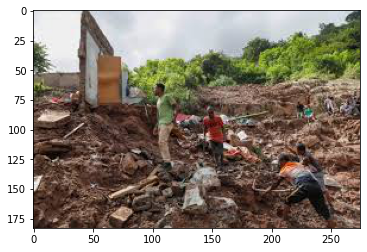

In [ ]:
predict_image('/content/drive/MyDrive/Train_Test/Test/5.jpeg')

1/1 [==============================] - 0s 263ms/step
Floods


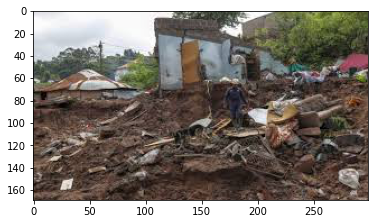

In [ ]:
predict_image('/content/drive/MyDrive/Train_Test/Test/2.jpeg')

1/1 [==============================] - 0s 277ms/step
Floods


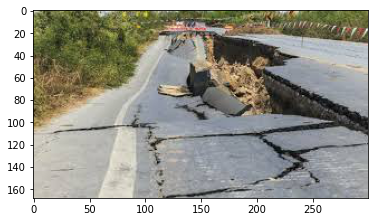



1/1 [==============================] - 0s 265ms/step
Thunder Storms


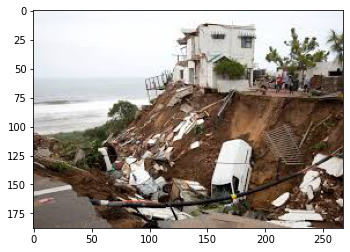



1/1 [==============================] - 0s 249ms/step
Floods


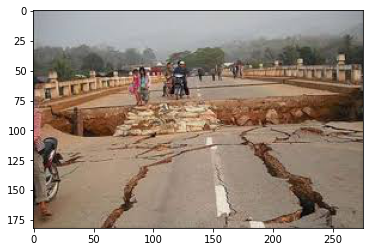



1/1 [==============================] - 0s 270ms/step
Floods


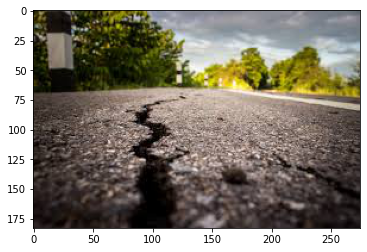



1/1 [==============================] - 0s 256ms/step
Floods


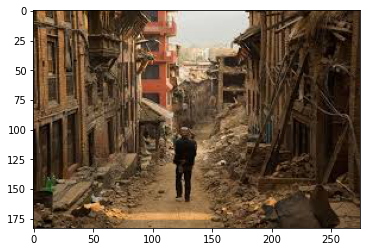



1/1 [==============================] - 0s 273ms/step
Thunder Storms


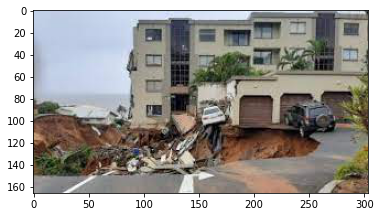



1/1 [==============================] - 0s 275ms/step
Floods


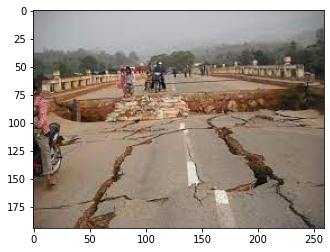



1/1 [==============================] - 0s 290ms/step
Floods


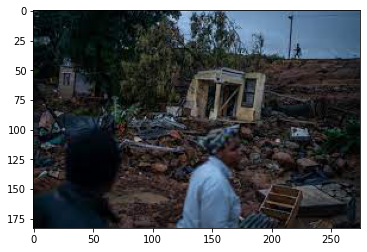



1/1 [==============================] - 0s 274ms/step
Thunder Storms


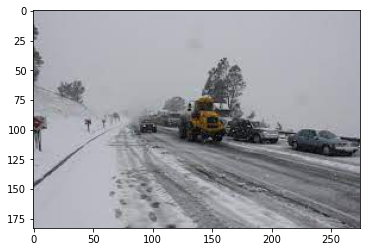



1/1 [==============================] - 0s 287ms/step
Floods


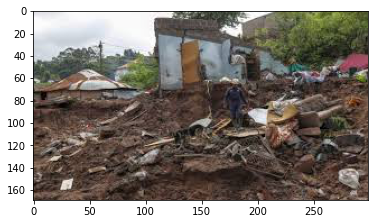



1/1 [==============================] - 0s 257ms/step
Landslide


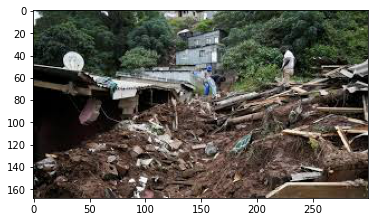



1/1 [==============================] - 0s 273ms/step
Landslide


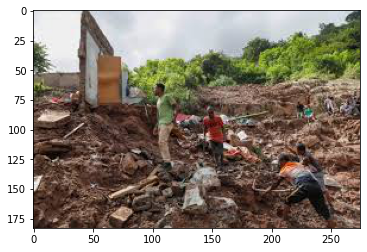



1/1 [==============================] - 0s 290ms/step
Landslide


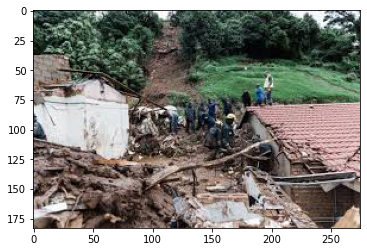



1/1 [==============================] - 0s 253ms/step
Floods


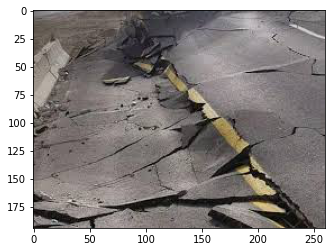



1/1 [==============================] - 0s 281ms/step
Floods


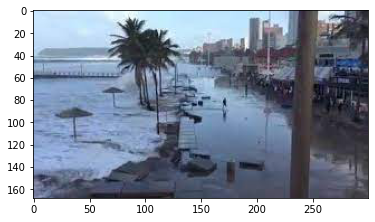



1/1 [==============================] - 0s 273ms/step
Thunder Storms


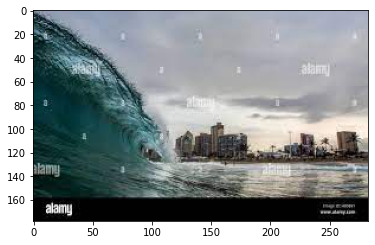



1/1 [==============================] - 0s 286ms/step
Floods


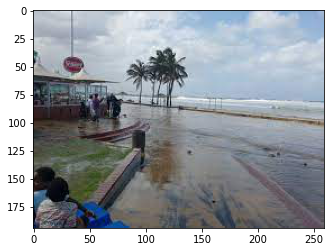



1/1 [==============================] - 0s 304ms/step
Floods


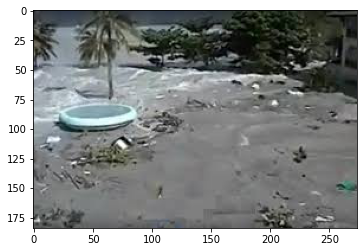



1/1 [==============================] - 0s 297ms/step
Thunder Storms


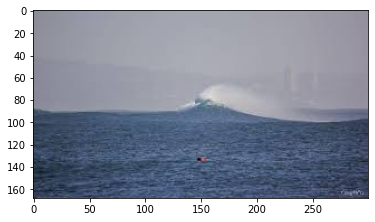



1/1 [==============================] - 0s 266ms/step
Floods


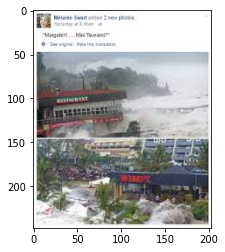



1/1 [==============================] - 0s 303ms/step
Floods


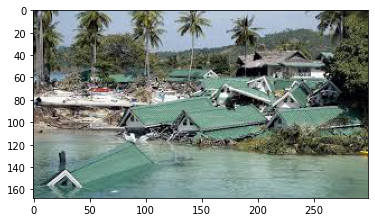



1/1 [==============================] - 0s 320ms/step
Thunder Storms


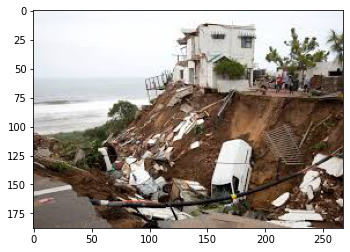



1/1 [==============================] - 0s 317ms/step
Floods


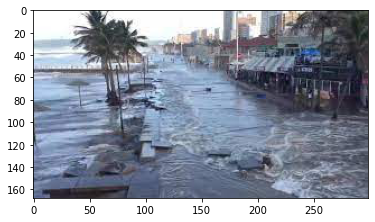



1/1 [==============================] - 0s 313ms/step
Landslide


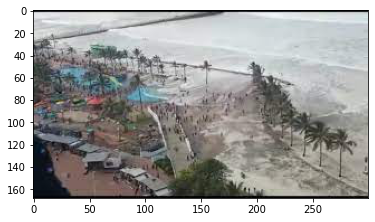



1/1 [==============================] - 0s 303ms/step
Landslide


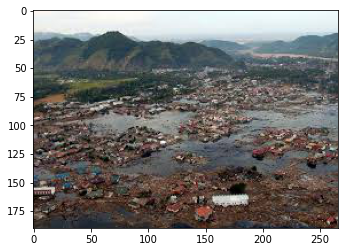



1/1 [==============================] - 0s 308ms/step
Floods


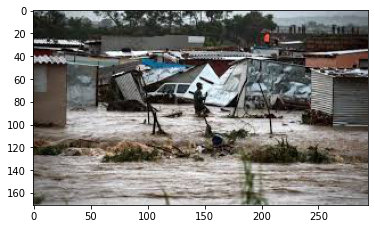



1/1 [==============================] - 0s 318ms/step
Floods


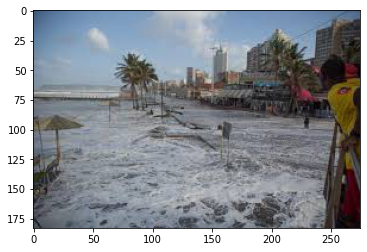



1/1 [==============================] - 0s 333ms/step
Landslide


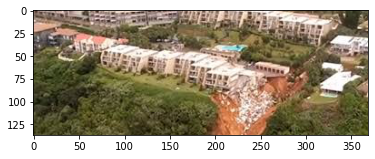



1/1 [==============================] - 0s 324ms/step
Floods


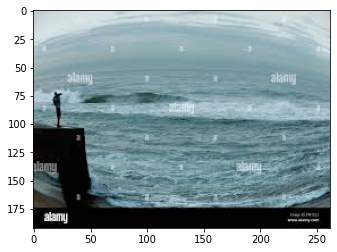



1/1 [==============================] - 0s 302ms/step
Floods


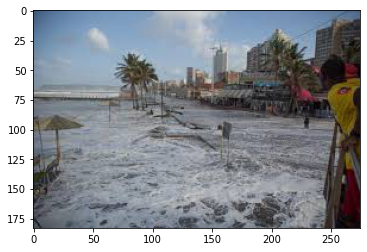



1/1 [==============================] - 0s 343ms/step
Floods


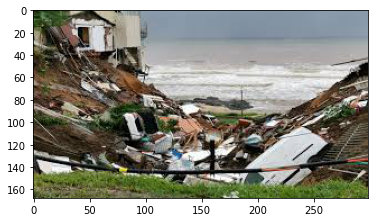



1/1 [==============================] - 0s 325ms/step
Floods


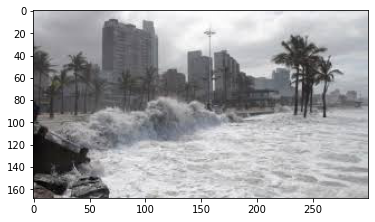



1/1 [==============================] - 0s 327ms/step
Floods


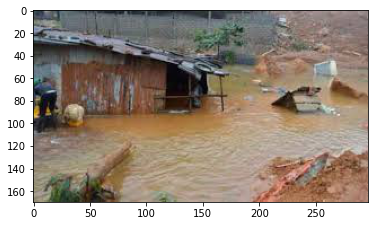



1/1 [==============================] - 0s 340ms/step
Floods


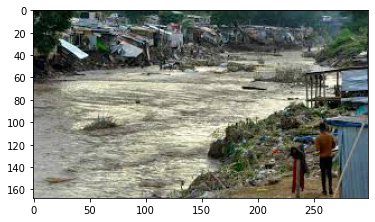



1/1 [==============================] - 0s 346ms/step
Thunder Storms


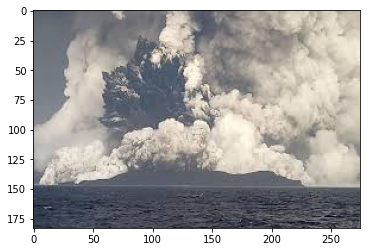



1/1 [==============================] - 0s 346ms/step
Floods


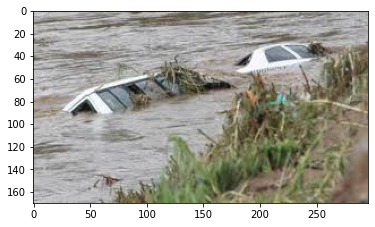



1/1 [==============================] - 0s 318ms/step
Floods


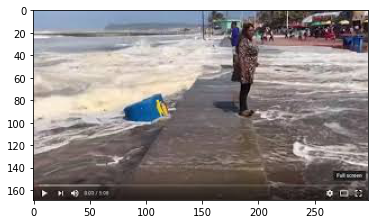



1/1 [==============================] - 0s 330ms/step
Floods


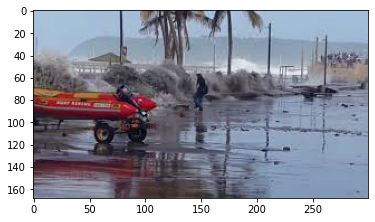



1/1 [==============================] - 0s 348ms/step
Thunder Storms


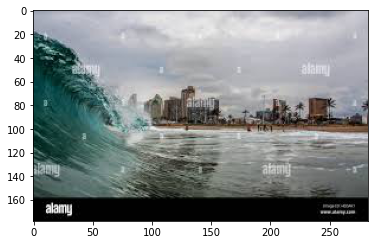



1/1 [==============================] - 0s 356ms/step
Landslide


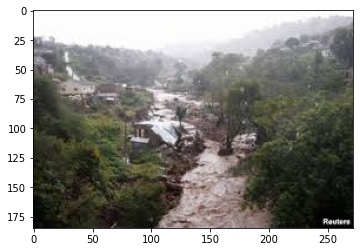



1/1 [==============================] - 0s 366ms/step
Floods


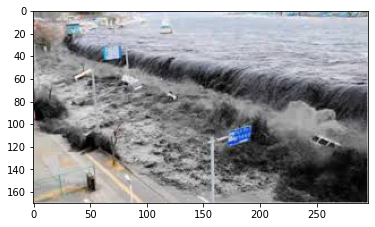



1/1 [==============================] - 0s 364ms/step
Floods


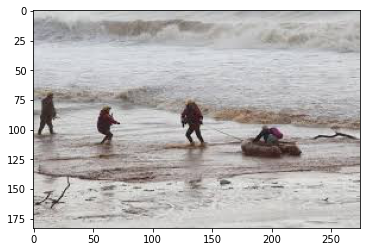



1/1 [==============================] - 0s 360ms/step
Floods


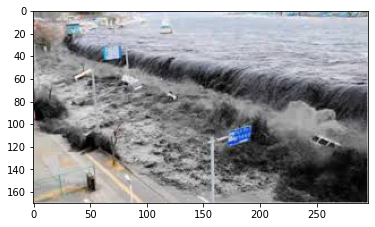



1/1 [==============================] - 0s 391ms/step
Thunder Storms


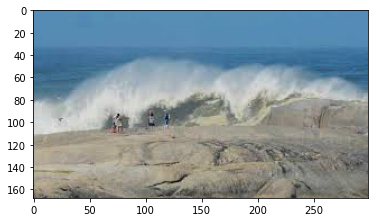



1/1 [==============================] - 0s 348ms/step
Floods


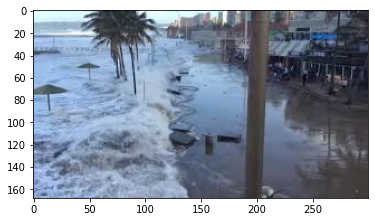



1/1 [==============================] - 0s 385ms/step
Landslide


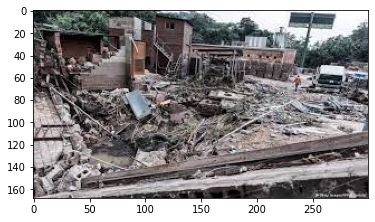



1/1 [==============================] - 0s 346ms/step
Floods


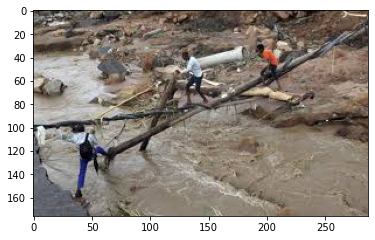



1/1 [==============================] - 0s 408ms/step
Floods


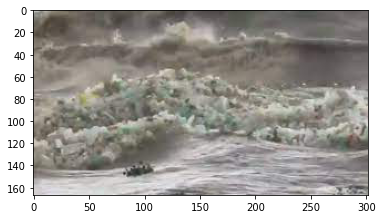



1/1 [==============================] - 0s 375ms/step
Floods


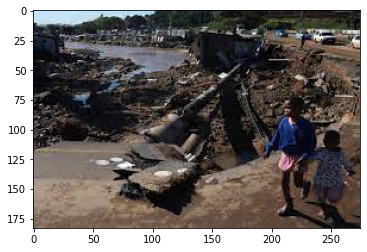



1/1 [==============================] - 0s 382ms/step
Floods


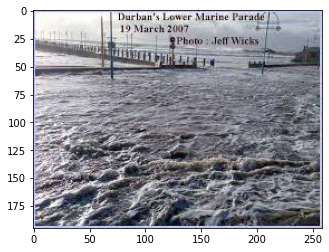



1/1 [==============================] - 0s 403ms/step
Floods


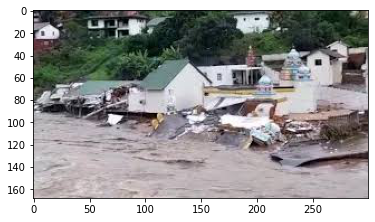



1/1 [==============================] - 0s 372ms/step
Thunder Storms


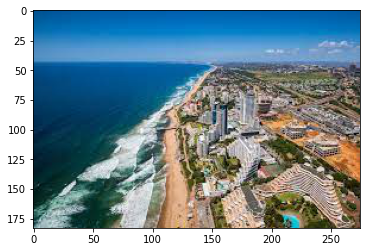



1/1 [==============================] - 0s 434ms/step
Floods


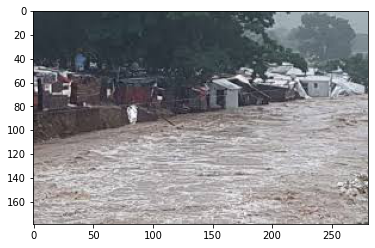



1/1 [==============================] - 0s 438ms/step
Landslide


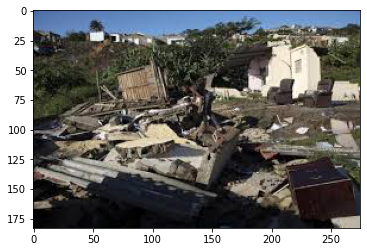



1/1 [==============================] - 0s 397ms/step
Floods


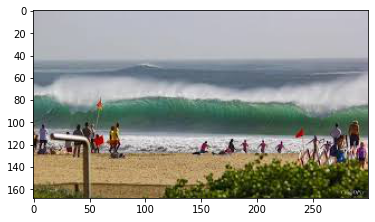



1/1 [==============================] - 0s 452ms/step
Floods


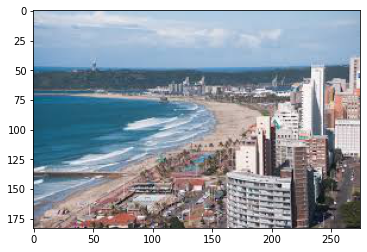



1/1 [==============================] - 0s 252ms/step
Floods


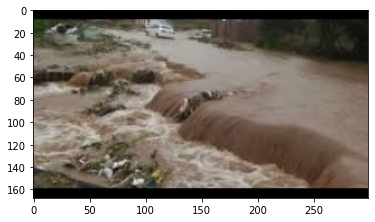



1/1 [==============================] - 0s 405ms/step
Floods


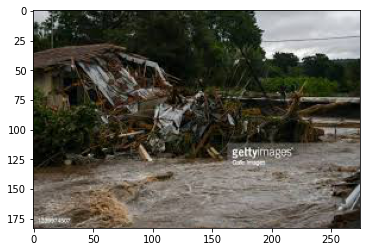



1/1 [==============================] - 0s 427ms/step
Floods


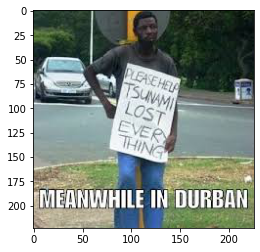



1/1 [==============================] - 0s 415ms/step
Floods


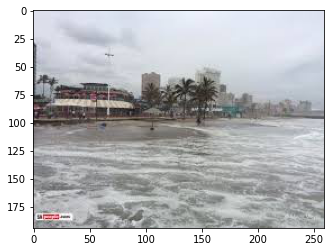



1/1 [==============================] - 0s 411ms/step
Floods


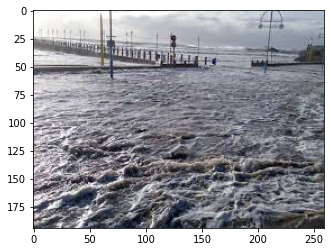



1/1 [==============================] - 0s 444ms/step
Floods


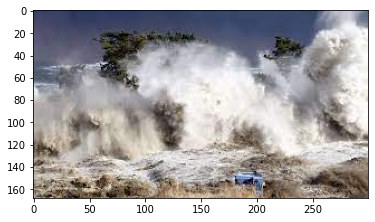



1/1 [==============================] - 0s 444ms/step
Thunder Storms


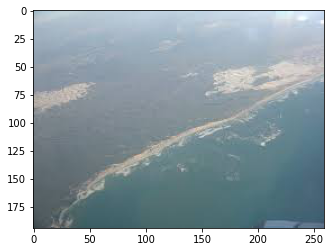



1/1 [==============================] - 0s 436ms/step
Floods


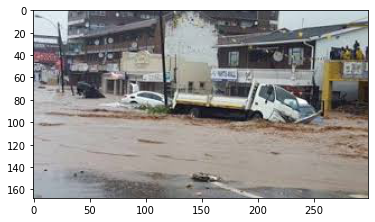



1/1 [==============================] - 0s 433ms/step
Floods


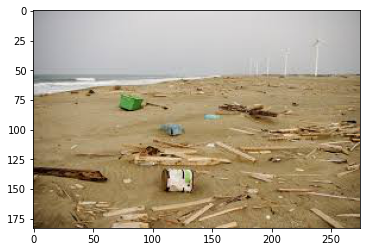

In [ ]:
path = test_path

for img in os.listdir(test_path):
    img_array = mpimg.imread(os.path.join(path,img))
    predict_image(os.path.join(path,img))
    plt.imshow(img_array)
    plt.show()
    print('\n')
    